In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import math
from PIL import Image
path = 'images/sample3.jpg'
#path = 'images/sample2.webp'
#path = 'images/sample.jpg'
plt.rcParams["figure.figsize"] = (20,20)

In [2]:
img = cv2.imread(path, 0)

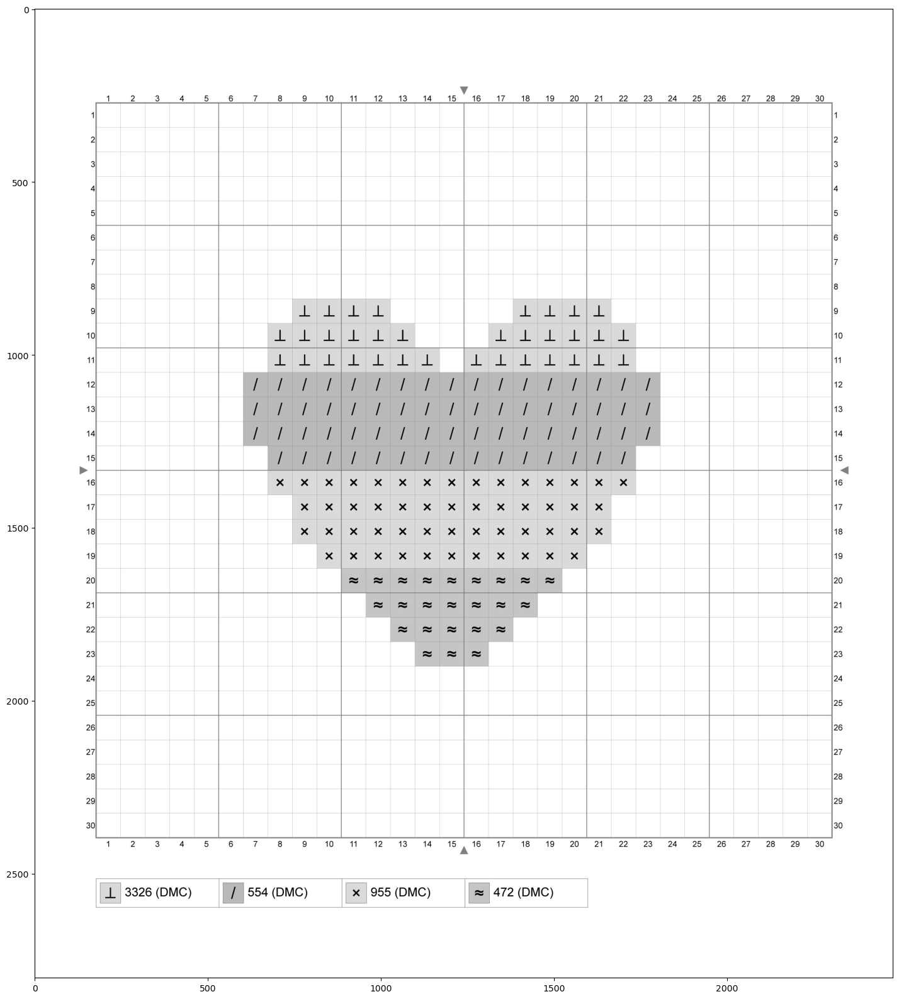

In [4]:
plt.imshow(img, cmap = 'gray')
plt.show()

In [5]:
def get_hough_lines(img):
    dst = cv2.Canny(img, 50, 200, None, 3)
    cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
    cdstP = np.copy(cdst)
    lines = cv2.HoughLines(dst, 1, np.pi / 180, 150, None, 0, 0)

    if lines is not None:
        for i in range(0, len(lines)):
            rho = lines[i][0][0]
            theta = lines[i][0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
            pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
            cv2.line(cdst, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
    return cdst

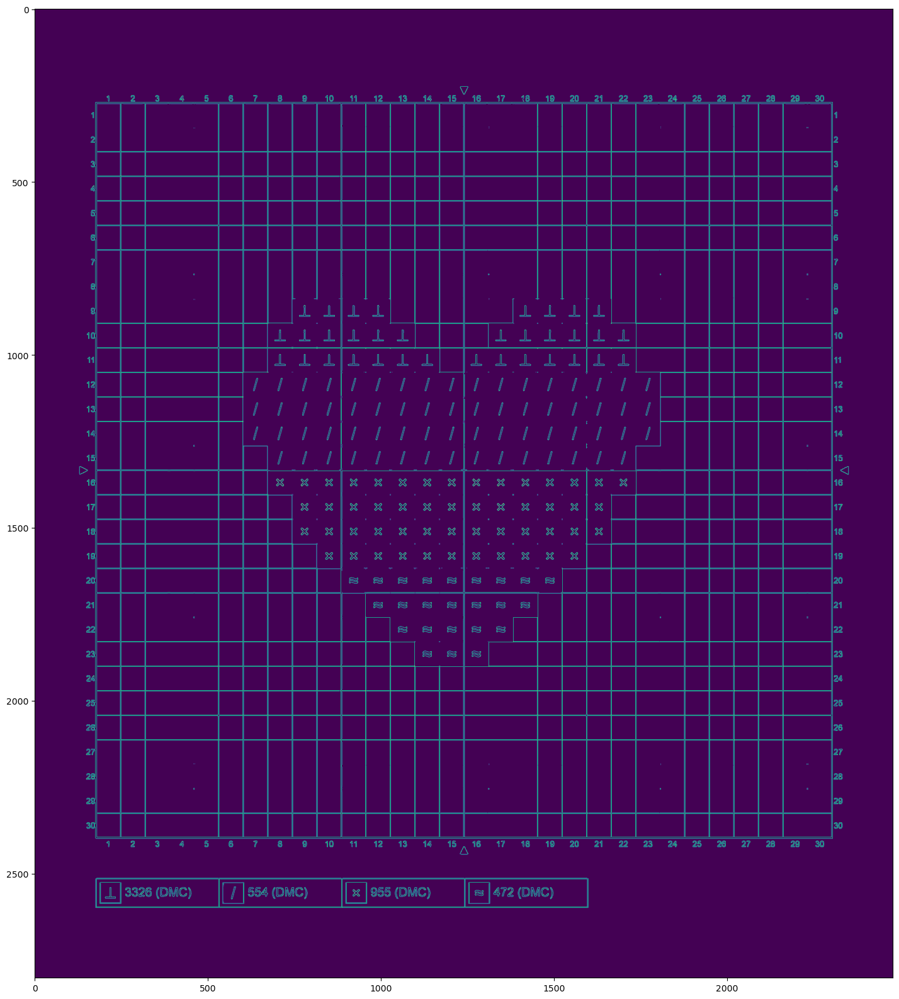

In [8]:
#img = blur(img, 3)
canny = cv2.Canny(img, 230, 230, None, 3)
plt.imshow(canny)
plt.show()

In [765]:
cv2.imwrite('output2.png', canny)

True

In [13]:
#img = blur(img,3)
dst = cv2.Canny(img, 250, 255, None, 3)
#dst = th[:]
cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
cdstP = np.copy(cdst)
#lines = cv2.HoughLines(dst, 1, np.pi / 180, 150, None, 0, 0)

#lines = cv2.HoughLines(dst,1,np.pi/180, 100)
lines = cv2.HoughLinesP(dst,1,np.pi/180,100,minLineLength=200,maxLineGap=100)

if lines is not None:
    for x in range(0, len(lines)):
        for x1,y1,x2,y2 in lines[x]:
            cv2.line(cdst,(x1,y1),(x2,y2),(0,255,0),3)

#lines = cv2.HoughLines(dst,1,np.pi/180,200)


    
#if lines is not None:
#    for i in range(0, len(lines)):
#        rho = lines[i][0][0]
#        theta = lines[i][0][1]
#        a = math.cos(theta)
#        b = math.sin(theta)
#        x0 = a * rho
#        y0 = b * rho
#        pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
#        pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
#        cv2.line(cdst, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
        

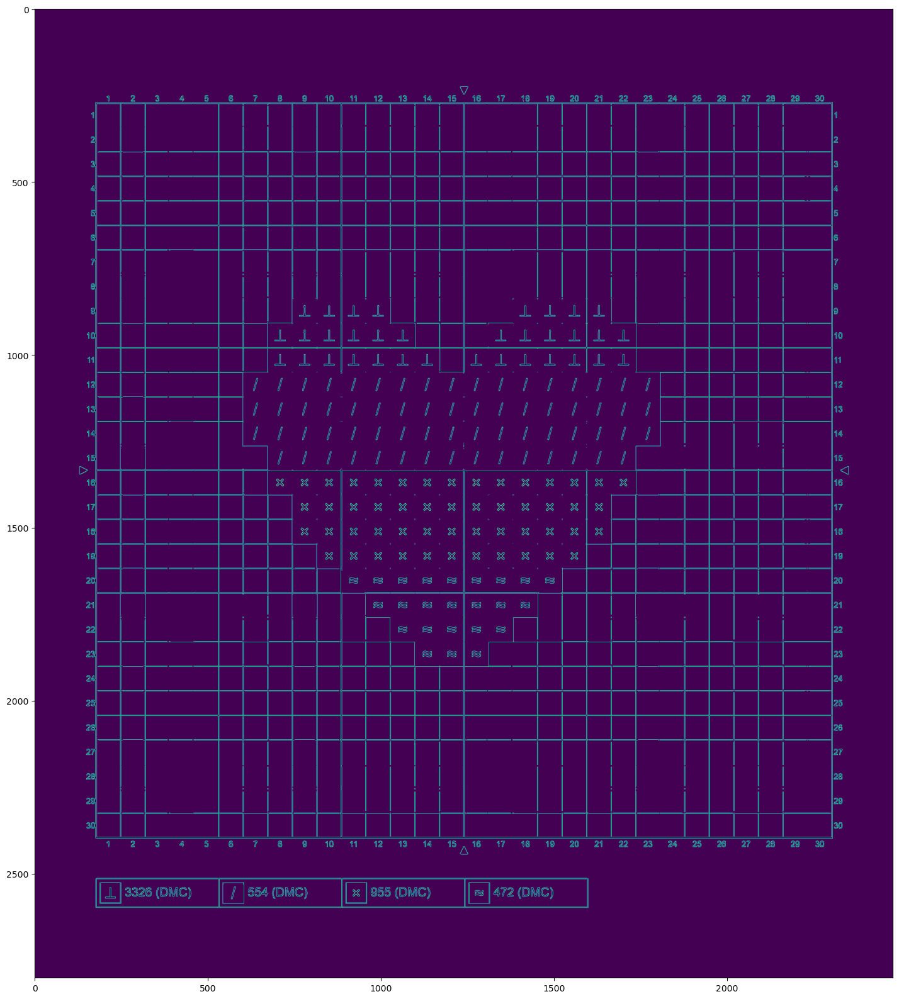

In [14]:
plt.imshow(dst)
plt.show()

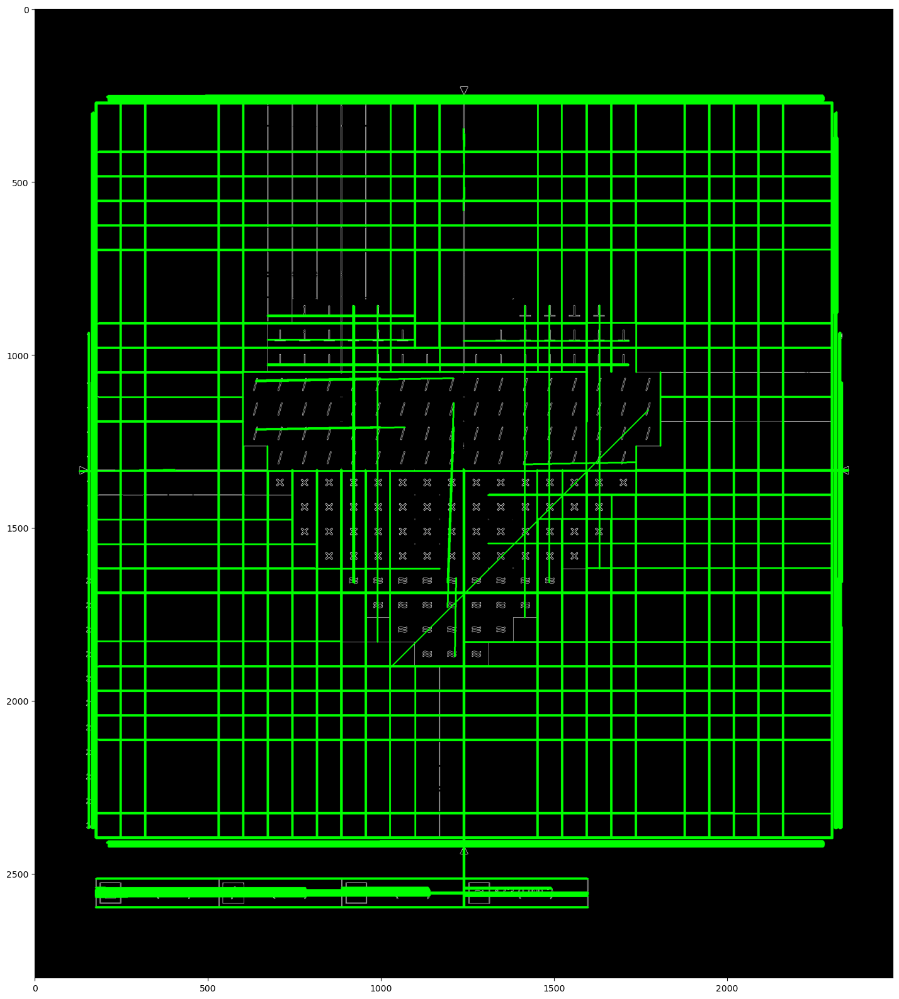

In [15]:
plt.imshow(cdst, cmap = 'gray')
plt.show()

In [16]:
cv2.imwrite('temp.png', cdst)

True

<ipython-input-18-cce47af7353b>:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 2, 1), plt.imshow(img, cmap='gray')
<ipython-input-18-cce47af7353b>:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 2, 2), plt.imshow(magnitude_spectrum, cmap='gray')


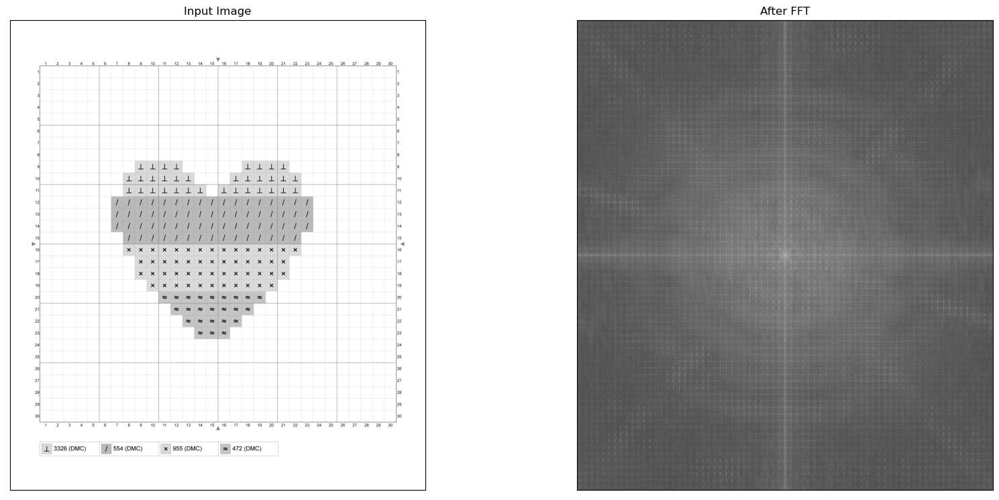

In [18]:
img = cv2.imread(path, 0)
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

plt.subplot(2, 2, 1), plt.imshow(img, cmap='gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 2), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('After FFT'), plt.xticks([]), plt.yticks([])
plt.show()

In [19]:
# Circular HPF mask, center circle is 0, remaining all ones
rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)

mask = np.ones((rows, cols, 2), np.uint8)
r = 100
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
mask[mask_area] = 0

In [20]:
np.sum(mask_area)

31417

In [21]:
# Circular LPF mask, center circle is 1, remaining all zeros
rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)

mask = np.zeros((rows, cols, 2), np.uint8)
r = 500
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
mask[mask_area] = 1

In [22]:
rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)

mask = np.zeros((rows, cols, 2), np.uint8)
r_out = 500
r_in = 10
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
mask_area = np.logical_and(((x - center[0]) ** 2 + (y - center[1]) ** 2 >= r_in ** 2),
                           ((x - center[0]) ** 2 + (y - center[1]) ** 2 <= r_out ** 2))
mask[mask_area] = 1

<ipython-input-23-339bb3c4e5cd>:18: RuntimeWarning: divide by zero encountered in log
  fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))


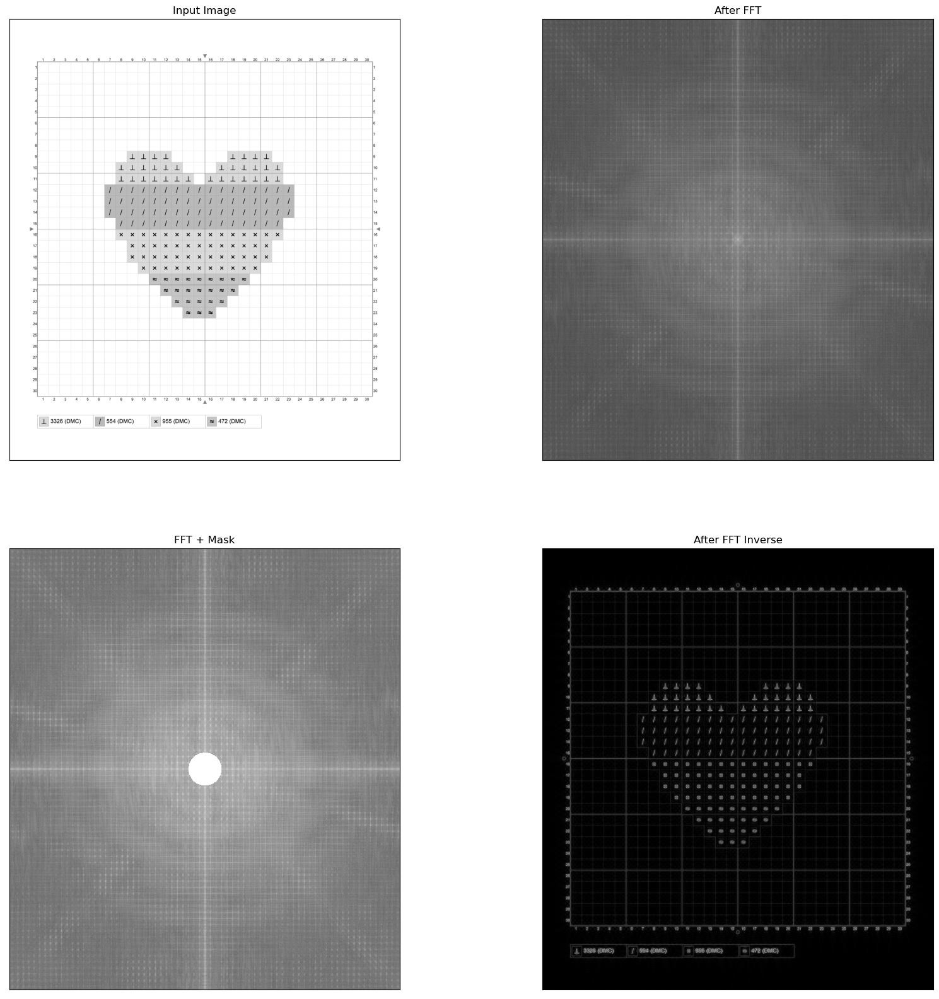

In [23]:
rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)  # center

# Circular HPF mask, center circle is 0, remaining all ones

mask = np.ones((rows, cols, 2), np.uint8)
r = 100
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r

#mask[center[0]-100:center[0]+100,:] = 0
mask[mask_area] = 0

# apply mask and inverse DFT
fshift = dft_shift * mask

fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

plt.subplot(2, 2, 1), plt.imshow(img, cmap='gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 2), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('After FFT'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 3), plt.imshow(fshift_mask_mag, cmap='gray')
plt.title('FFT + Mask'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 4), plt.imshow(img_back, cmap='gray')
plt.title('After FFT Inverse'), plt.xticks([]), plt.yticks([])
plt.show()

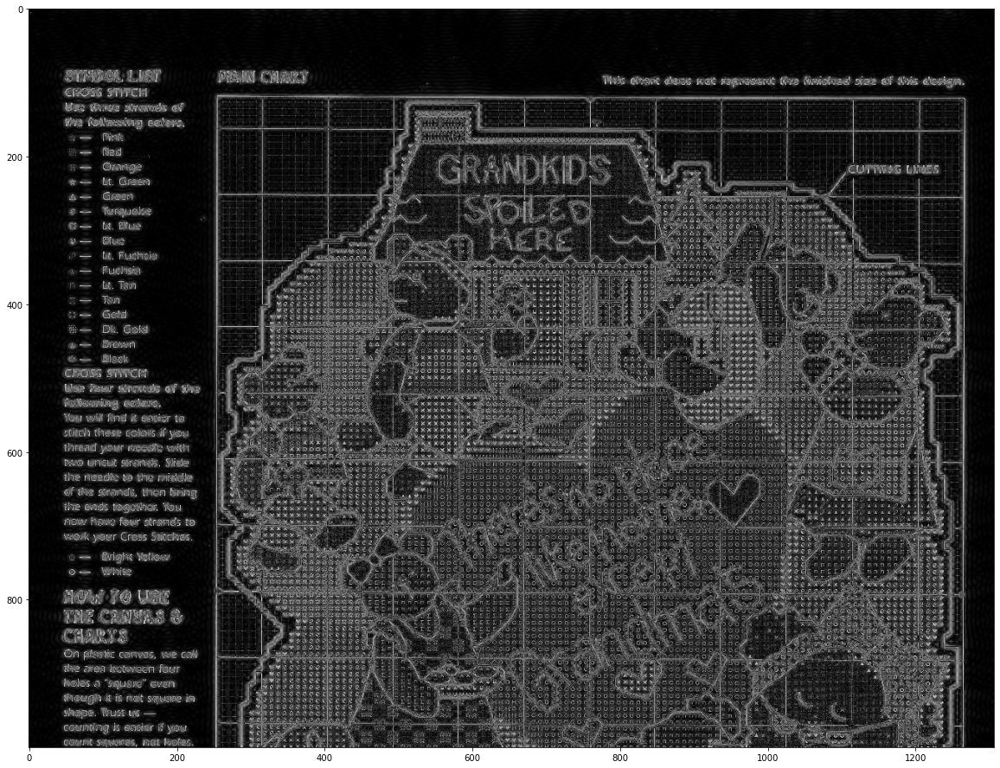

In [693]:
plt.imshow(img_back, cmap = 'gray')

In [666]:
def get_image(arr):
    image_from_array = Image.fromarray(img_back)
    pix = np.array(image_from_array)
    return pix

def normalize(img):
    return cv2.normalize(src=img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

def blur(img, k = 3):
    return cv2.medianBlur(img, k) 

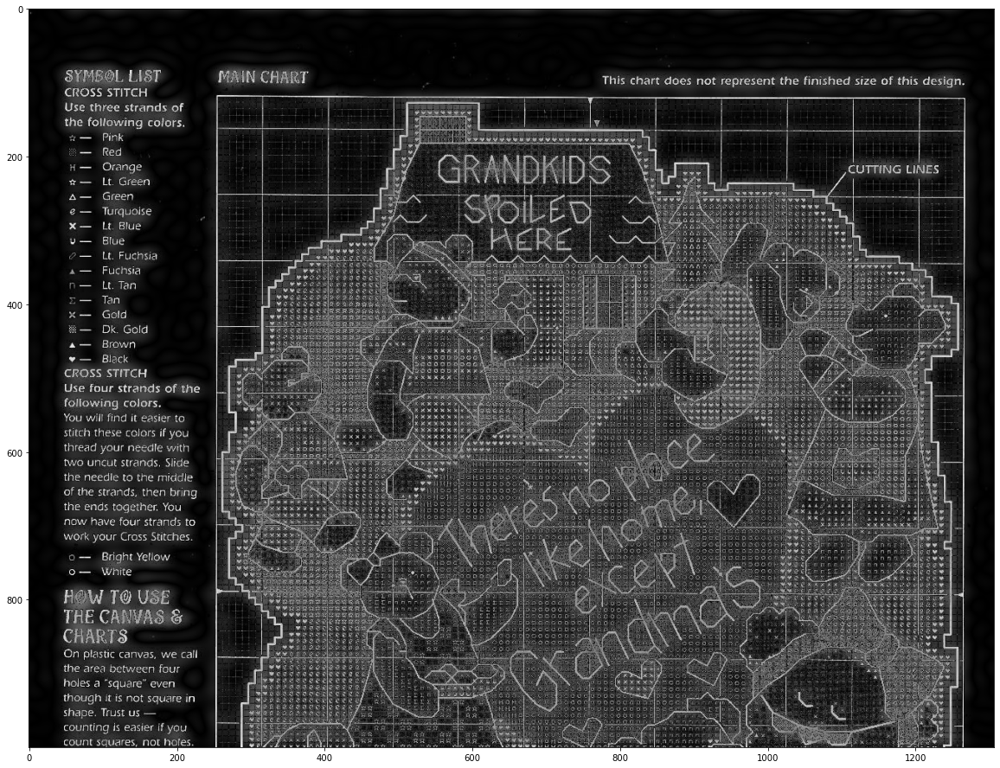

In [667]:
filt = normalize(img_back)
plt.imshow(filt, cmap = 'gray')

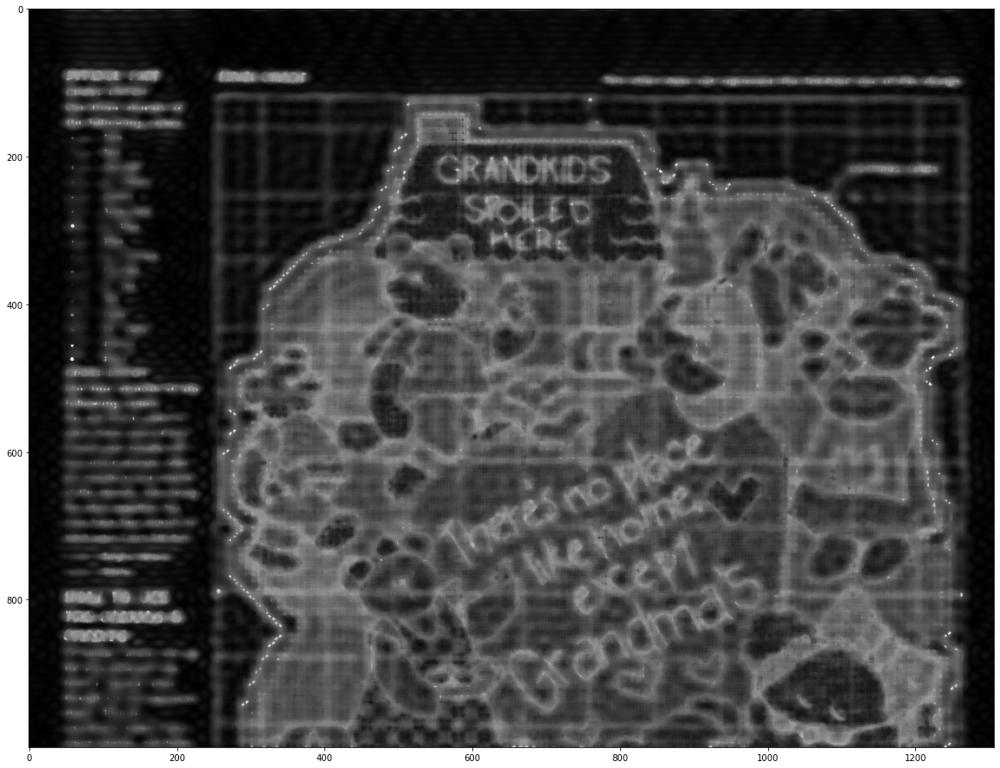

In [659]:
blured = blur(filt, k = 7)
plt.imshow(blured, cmap = 'gray')

In [276]:
np.mean(filt), np.mean(th)

(37.60366258607498, 10.79265925554722)

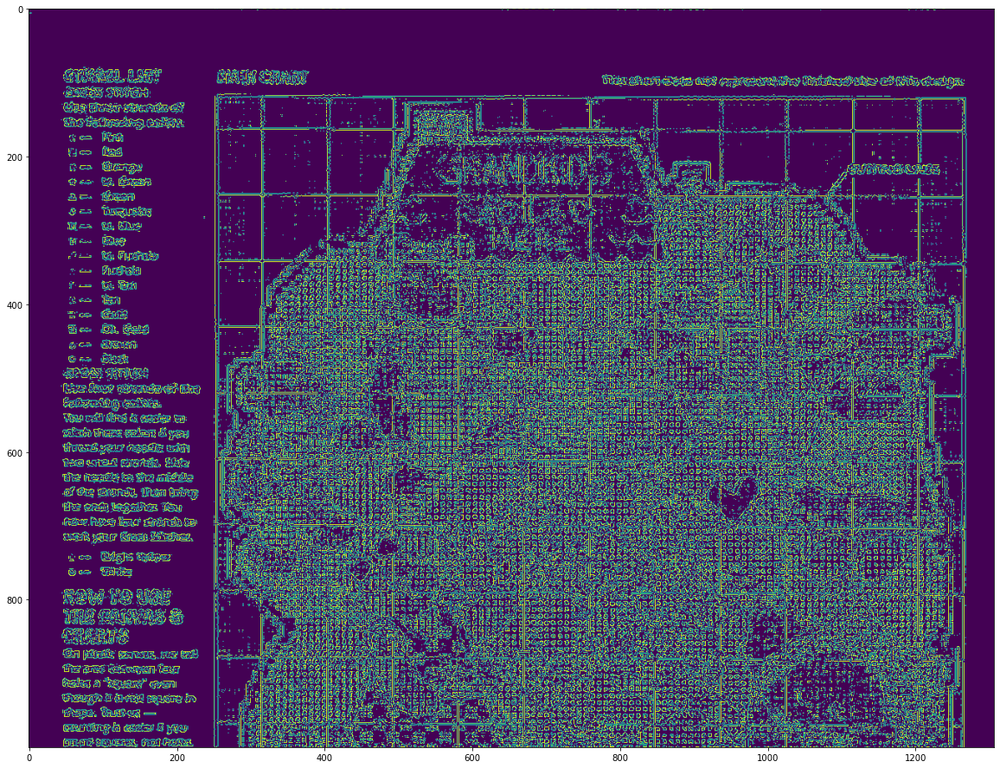

In [277]:
canny = cv2.Canny(filt, 200, 200, None, 3)
plt.imshow(canny)

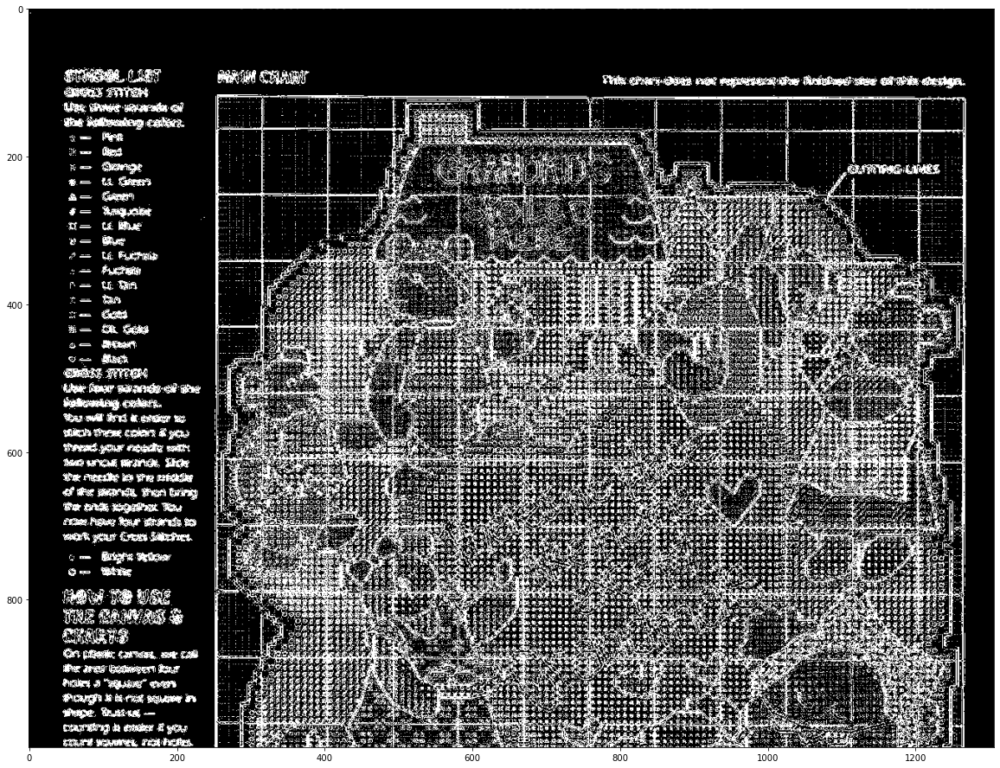

In [278]:
r, th = cv2.threshold(filt,50,255,cv2.THRESH_BINARY)
plt.imshow(th, cmap = 'gray')

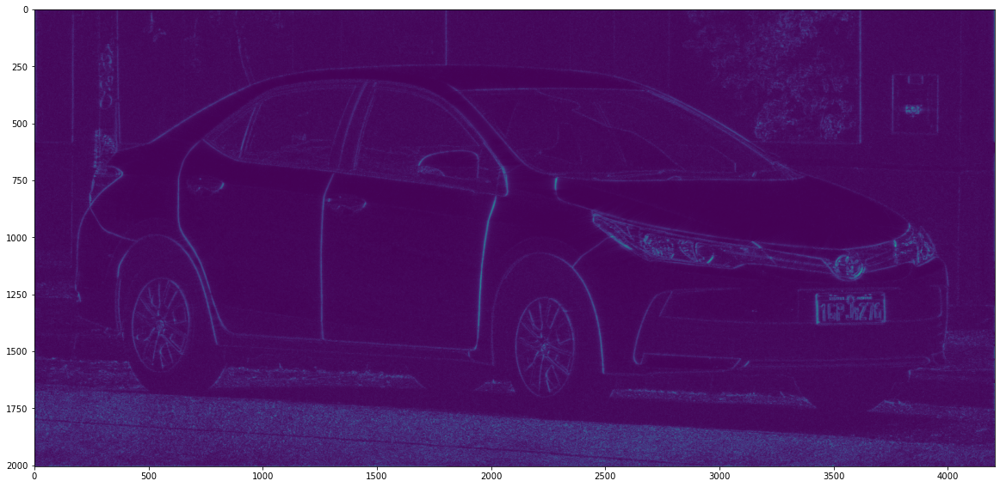

In [152]:
plt.imshow(img_back)

<ipython-input-105-01aba4c91c37>:21: RuntimeWarning: divide by zero encountered in log
  fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))


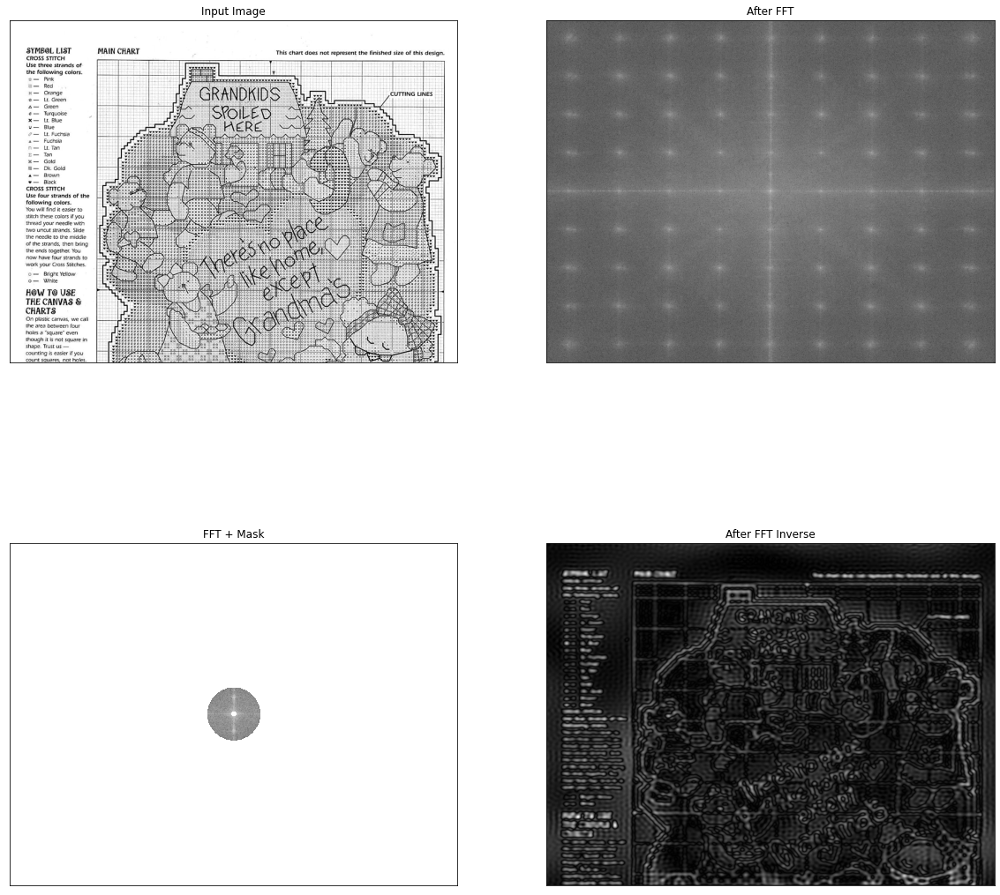

In [105]:
rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)  # center

# Concentric BPF mask,with are between the two cerciles as one's, rest all zero's.
rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)

mask = np.zeros((rows, cols, 2), np.uint8)
r_out = 80
r_in = 5
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]

mask_area = np.logical_and(((x - center[0]) ** 2 + (y - center[1]) ** 2 >= r_in ** 2),
                           ((x - center[0]) ** 2 + (y - center[1]) ** 2 <= r_out ** 2))
mask[mask_area] = 1

# apply mask and inverse DFT
fshift = dft_shift * mask

fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

plt.subplot(2, 2, 1), plt.imshow(img, cmap='gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 2), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('After FFT'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 3), plt.imshow(fshift_mask_mag, cmap='gray')
plt.title('FFT + Mask'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 4), plt.imshow(img_back, cmap='gray')
plt.title('After FFT Inverse'), plt.xticks([]), plt.yticks([])
plt.show()